In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append("/home/rbusche/projects/incense/")

In [3]:
ids = [12, 13, 14, 15, 16, 17, 18, 19, 20]

In [4]:
len(ids)

9

In [5]:
from incense import FileSystemExperimentLoader
from IPython import display
import matplotlib as mpl

mpl.rc_file("matplotlibrc")
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [6]:
RUNS_DIR = "/home/rbusche/runs/"
loader = FileSystemExperimentLoader(RUNS_DIR)

In [7]:
exp = loader.find_by_id(12)
exp

FileSystemExperiment(id=12, name=configs/cohort_18_paper/kde_elu/kde_elu_seed_01)

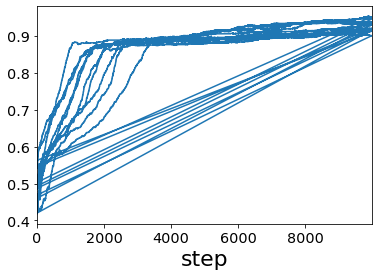

In [8]:
exp.metrics["test.accuracy"].plot()

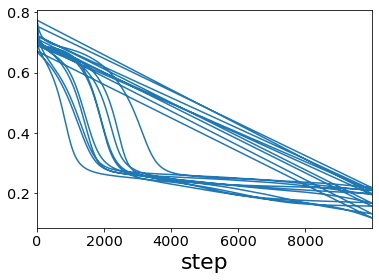

In [9]:
exp.metrics["test.loss"].plot()

In [10]:
# for id_ in ids:
#     exp = loader.find_by_id(id_)
#     text = f"## activation function = {exp.config.activation_fn}, estimator = {exp.config.estimator}"
#     display.display(display.Markdown(text))
#     display.display(exp.artifacts["infoplane_test"].as_content_type("image/png").render())

In [11]:
measures_all_runs_test = exp.artifacts["information_measures_test.csv"].as_content_type("text/csv").render()
measures_all_runs_test

,epoch,layer,MI_XM,MI_YM,run
0,0,0,9.677705,0.998802,0
1,0,1,9.677430,0.998774,0
2,0,2,9.654006,0.989532,0
3,0,3,8.605179,0.592560,0
4,0,4,5.665702,0.109257,0
...,...,...,...,...,...
14995,9900,1,9.677712,0.998814,9
14996,9900,2,9.665556,0.998155,9
14997,9900,3,9.188104,0.962625,9
14998,9900,4,7.291998,0.886416,9


In [12]:
measures_summary = {}
measures_summary["mi_mean_over_runs"] = measures_all_runs_test.groupby(
            ["epoch", "layer"]
).mean()


In [13]:
exps = sorted([loader.find_by_id(id_) for id_ in ids], key=lambda exp: (exp.config.activation_fn, exp.config.estimator))
for exp in exps:
    print(exp.config.optimizer)

sgd
sgd
sgd
sgd
sgd
sgd
sgd
sgd
sgd


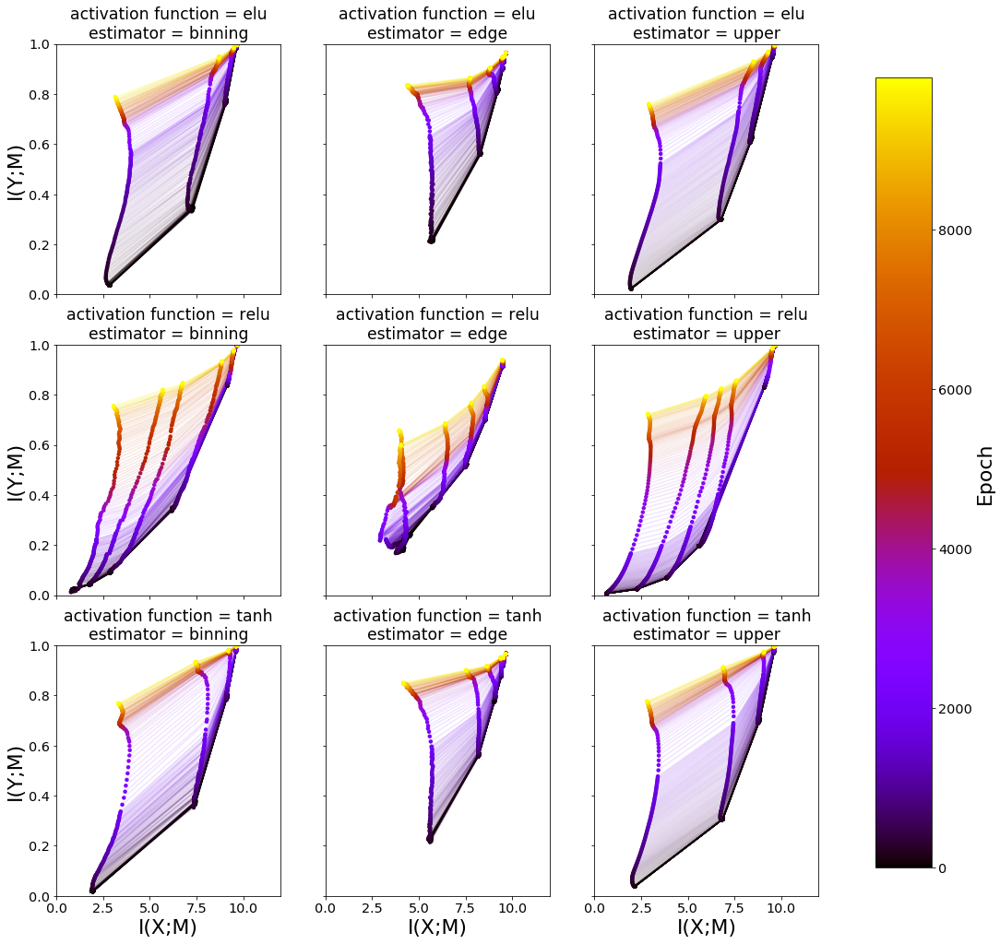

In [14]:
from math import ceil
from itertools import zip_longest


def plot_panel(ids, loader, information_measures_artifact_name: str):
    exps = sorted([loader.find_by_id(id_) for id_ in ids], key=lambda exp: (exp.config.activation_fn, exp.config.estimator))
    activation_functions = {exp.config.activation_fn for exp in exps}
    estimators = {exp.config.estimator for exp in exps}

    fig, axes = plt.subplots(nrows=len(activation_functions), ncols=len(estimators), sharex=True, sharey=True, figsize=(17, 17))
    for exp, ax in zip(exps, axes.flat):
        mi_measures = (
            exp.artifacts[information_measures_artifact_name]
            .as_content_type("text/csv")
            .render()
            .set_index(["epoch", "layer"])
            .groupby(["epoch", "layer"])
            .mean()
        )
        sm = infoplane_plot(mi_measures, ax)
        ax.set_title(f"activation function = {exp.config.activation_fn}\nestimator = {exp.config.estimator.split('.')[-1]}")
        
    for ax in axes[:, 0]:
        ax.set(ylabel='I(Y;M)')

    for ax in axes[-1, :]:
        ax.set(xlabel='I(X;M)')

    
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])

    fig.colorbar(sm, label='Epoch', cax=cbar_ax)
    #fig.tight_layout()

    return fig


def infoplane_plot(measures, ax):
    total_epochs = measures.index.get_level_values('epoch')[-1] + 1  # epoch index starts at 0
    sm = plt.cm.ScalarMappable(cmap='gnuplot', norm=plt.Normalize(vmin=0, vmax=total_epochs))
    sm.set_array([])
    for epoch, mi_measures in measures.groupby(level=0):
        color = sm.to_rgba(epoch)

        xmvals = np.array(mi_measures['MI_XM'])
        ymvals = np.array(mi_measures['MI_YM'])

        ax.plot(xmvals, ymvals, color=color, alpha=0.1, zorder=1)
        ax.scatter(xmvals, ymvals, s=20, facecolors=color, edgecolor='none', zorder=2)
        ax.set(xlim=[0, 12], ylim=[0, 1])
    return sm


fig = plot_panel(ids, loader, "information_measures_test.csv");
fig.savefig("results_test.pdf")

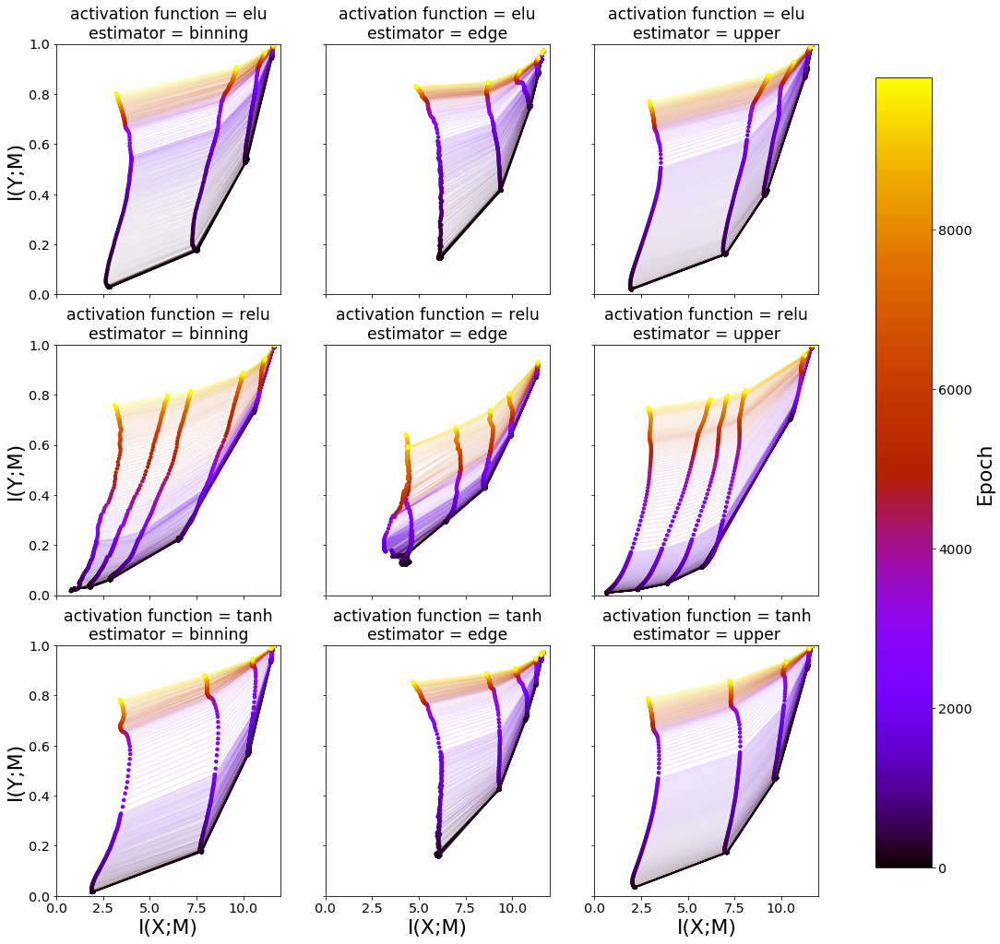

In [16]:
fig = plot_panel(ids, loader, "information_measures_train.csv");
fig.savefig("results_train.pdf")

In [24]:
layer_mi_measures = (
            exp.artifacts["information_measures_test.csv"]
            .as_content_type("text/csv")
            .render()
            .set_index(["epoch", "layer"])
            .groupby(["epoch", "layer"])
            .mean()
            .drop(columns="run")
        ).query("layer == 5")
layer_mi_measures

,,MI_XM,MI_YM
epoch,layer,,
0,5,2.155041,0.037834
1,5,2.156193,0.037802
2,5,2.157287,0.037774
3,5,2.158306,0.037748
4,5,2.159281,0.037724
...,...,...,...
9500,5,2.843217,0.772819
9600,5,2.834446,0.773134
9700,5,2.825467,0.774226


In [28]:
def shows_compression(layer_mi_measures: pd.DataFrame, input_information_threshold=0.5, output_information_threshold=0.05) -> bool:
    discards_input_information = layer_mi_measures["MI_XM"].iloc[-1] / layer_mi_measures["MI_XM"].iloc[0] < input_information_threshold
    retains_output_information = layer_mi_measures["MI_YM"].iloc[-1] > (layer_mi_measures["MI_YM"].max() - output_information_threshold)
    return discards_input_information and retains_output_information

In [38]:
def analyze_compression(ids, loader, information_measures_artifact_name: str):
    exps = sorted([loader.find_by_id(id_) for id_ in ids], key=lambda exp: (exp.config.activation_fn, exp.config.estimator))
    activation_functions = {exp.config.activation_fn for exp in exps}
    estimators = {exp.config.estimator for exp in exps}

    compression_analyses = []

    for exp in exps:
        mi_measures = (
            exp.artifacts[information_measures_artifact_name]
            .as_content_type("text/csv")
            .render()
            .set_index(["epoch", "layer"])
            .groupby(["epoch", "layer"])
            .mean()
            .drop(columns="run")
        )
        
        compression_analysis = mi_measures.groupby("layer", as_index = False).apply(shows_compression).to_frame().rename(columns={0: "compression"})
        compression_analysis["activation function"]  = exp.config.activation_fn
        compression_analysis["estimator"]  = exp.config.estimator.split('.')[-1]

        compression_analyses.append(compression_analysis)
        

    return pd.concat(compression_analyses)

In [40]:
analyze_compression(ids, loader, "information_measures_test.csv").to_csv("compression_test.csv", index_label="layer")

In [41]:
analyze_compression(ids, loader, "information_measures_train.csv").to_csv("compression_train.csv", index_label="layer")